# Import Library
Pada bagian ini dilakukan import berbagai library yang dibutuhkan untuk proses data analysis, preprocessing, visualisasi, dan machine learning.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from google.colab import files
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.svm import SVC

# Upload Dataset

Pada bagian ini, kita mengunggah file dataset dari komputer lokal ke Google Colab menggunakan fungsi `files.upload()` dari library `google.colab`. Setelah file diunggah, file tersebut bisa langsung digunakan dalam proses analisis data selanjutnya.


In [2]:
# Meng-upload file
uploaded = files.upload()

Saving enhanced_student_habits_performance_dataset.csv to enhanced_student_habits_performance_dataset.csv


## Read Dataset

Setelah file dataset berhasil diunggah, langkah berikutnya adalah membaca isi file CSV tersebut ke dalam sebuah DataFrame menggunakan `pd.read_csv()`. Kemudian, kita tampilkan 5 baris pertama dari data menggunakan `df.head()` untuk melihat gambaran awal struktur dan isi data yang akan dianalisis.


In [3]:
# Membaca file CSV
df = pd.read_csv("enhanced_student_habits_performance_dataset.csv")

# Melihat 5 data teratas
print(df.head())

   student_id  age  gender             major  study_hours_per_day  \
0      100000   26    Male  Computer Science             7.645367   
1      100001   28    Male              Arts             5.700000   
2      100002   17    Male              Arts             2.400000   
3      100003   27   Other        Psychology             3.400000   
4      100004   25  Female          Business             4.700000   

   social_media_hours  netflix_hours part_time_job  attendance_percentage  \
0                 3.0            0.1           Yes                   70.3   
1                 0.5            0.4            No                   88.4   
2                 4.2            0.7            No                   82.1   
3                 4.6            2.3           Yes                   79.3   
4                 0.8            2.7           Yes                   62.9   

   sleep_hours  ... screen_time  study_environment access_to_tutoring  \
0          6.2  ...        10.9  Co-Learning Grou

Dataset ini berisi 80.000 sampel data yang merekam berbagai kebiasaan, kondisi, serta performa akademik mahasiswa, dengan tujuan untuk memprediksi risiko dropout. Setiap baris mewakili data dari satu mahasiswa.

Fitur-fitur yang terdapat dalam dataset ini adalah:
1. student_id: ID unik mahasiswa
2. age: Usia mahasiswa
3. gender: Jenis kelamin
4. major: Jurusan mahasiswa
5. study_hours_per_day: Jumlah jam belajar per hari
6. social_media_hours: Jumlah jam menggunakan media sosial per hari
7. netflix_hours: Jumlah jam menonton Netflix per hari
8. part_time_job: Status memiliki pekerjaan paruh waktu
9. attendance_percentage: Persentase kehadiran kelas
10. sleep_hours: Rata-rata jam tidur per hari
11. diet_quality: Kualitas pola makan
12. exercise_frequency: Frekuensi olahraga per minggu
13. parental_education_level: Tingkat pendidikan orang tua
14. internet_quality: Kualitas koneksi internet di tempat tinggal
15. mental_health_rating: Skor kesehatan mental
16. extracurricular_participation: Keikutsertaan dalam kegiatan ekstrakurikuler
17. previous_gpa: Nilai GPA sebelumnya
18. semester: Semester saat ini
19. stress_level: Skor tingkat stres
20. dropout_risk: Risiko dropout (target: 'Low', 'Medium', atau 'High')
21. social_activity: Jumlah aktivitas sosial yang diikuti
22. screen_time: Total jam screen time per hari
23. study_environment: Kondisi lingkungan belajar
24. access_to_tutoring: Akses ke layanan bimbingan belajar
25. family_income_range: Rentang pendapatan keluarga
26. parental_support_level: Tingkat dukungan orang tua
27. motivation_level: Tingkat motivasi belajar
28. exam_anxiety_score: Skor kecemasan ujian
29. learning_style: Gaya belajar dominan
30. time_management_score: Skor kemampuan manajemen waktu
31. exam_score: Nilai ujian akhir

# Exploratory Data Analysis (EDA)

1. Menampilkan Informasi Struktur Data

Dengan menggunakan `df.info()`, kita bisa melihat ringkasan informasi tentang dataset, seperti:
- Jumlah total baris (entries)
- Jumlah kolom beserta nama-namanya
- Tipe data di masing-masing kolom (`int64`, `float64`, `object`, dll.)
- Jumlah nilai non-null (tidak kosong) di tiap kolom

Langkah ini penting untuk memastikan data yang kita miliki tidak ada kolom kosong atau tipe data yang tidak sesuai sebelum masuk ke tahap preprocessing.


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   student_id                     80000 non-null  int64  
 1   age                            80000 non-null  int64  
 2   gender                         80000 non-null  object 
 3   major                          80000 non-null  object 
 4   study_hours_per_day            80000 non-null  float64
 5   social_media_hours             80000 non-null  float64
 6   netflix_hours                  80000 non-null  float64
 7   part_time_job                  80000 non-null  object 
 8   attendance_percentage          80000 non-null  float64
 9   sleep_hours                    80000 non-null  float64
 10  diet_quality                   80000 non-null  object 
 11  exercise_frequency             80000 non-null  int64  
 12  parental_education_level       80000 non-null 

2. Menghapus Kolom yang Tidak Diperlukan

Menghapus kolom `student_id` dari dataset karena kolom ini bersifat unik untuk tiap baris data (identifier) dan tidak memiliki kontribusi terhadap proses pemodelan machine learning.

In [5]:
df.drop(['student_id'], axis=1, inplace=True)

3. Mengecek Jumlah Data Kosong (Missing Values) pada Setiap Kolom

Melakukan pengecekan jumlah nilai kosong (missing values) di setiap kolom dataset untuk memastikan tidak ada data yang hilang sebelum dilakukan proses analisis lebih lanjut.

In [6]:
df.isnull().sum()

,0
age,0
gender,0
major,0
study_hours_per_day,0
social_media_hours,0
netflix_hours,0
part_time_job,0
attendance_percentage,0
sleep_hours,0
diet_quality,0


4. Mengecek Jumlah Data Duplikat

Melakukan pengecekan jumlah baris data yang terduplikasi dalam dataset. Data duplikat perlu diidentifikasi karena dapat mempengaruhi akurasi model jika tidak ditangani.

In [7]:
print('Jumlah data duplicated: ', df.duplicated().sum())

Jumlah data duplicated:  0


5. Visualisasi Distribusi Fitur Numerik

Tujuan:
Melihat **distribusi data pada tiap fitur numerik** di dataset. Ini penting untuk:
- Mengetahui bentuk distribusi (normal, skewed, dll)
- Mengidentifikasi outlier secara visual
- Menyesuaikan preprocessing nantinya (misal scaling, transformasi)

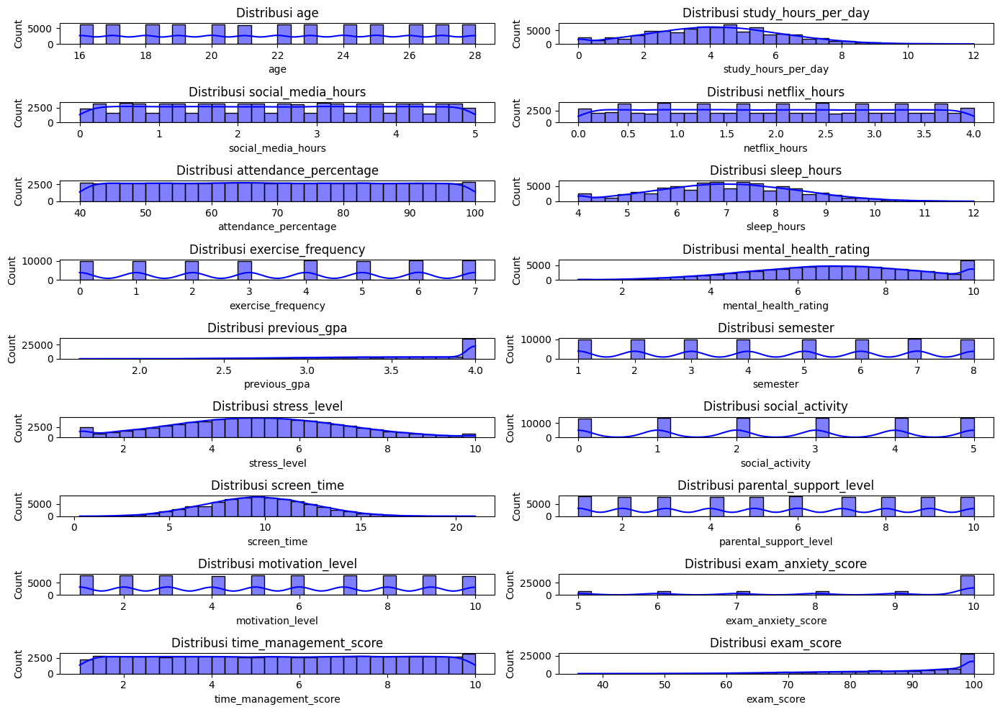

In [8]:
num_features = df.select_dtypes(include=[np.number]).columns
num_plots = len(num_features)
num_rows = int(np.ceil(num_plots / 2))  # Calculate the number of rows needed

plt.figure(figsize=(14, 10))
for i, column in enumerate(num_features, 1):
    plt.subplot(num_rows, 2, i)  # Adjust subplot layout dynamically
    sns.histplot(df[column], bins=30, kde=True, color='blue')
    plt.title(f'Distribusi {column}')
plt.tight_layout()
plt.show()

6. Pairplot Fitur Numerik

Tujuan:
Melihat **hubungan antar fitur numerik** sekaligus distribusi masing-masing fitur di dataset. Pairplot ini sangat berguna untuk:
- Mengidentifikasi hubungan linear/nonlinear antar variabel
- Melihat pola cluster atau distribusi kelas kalau ada target label
- Memeriksa outlier secara visual

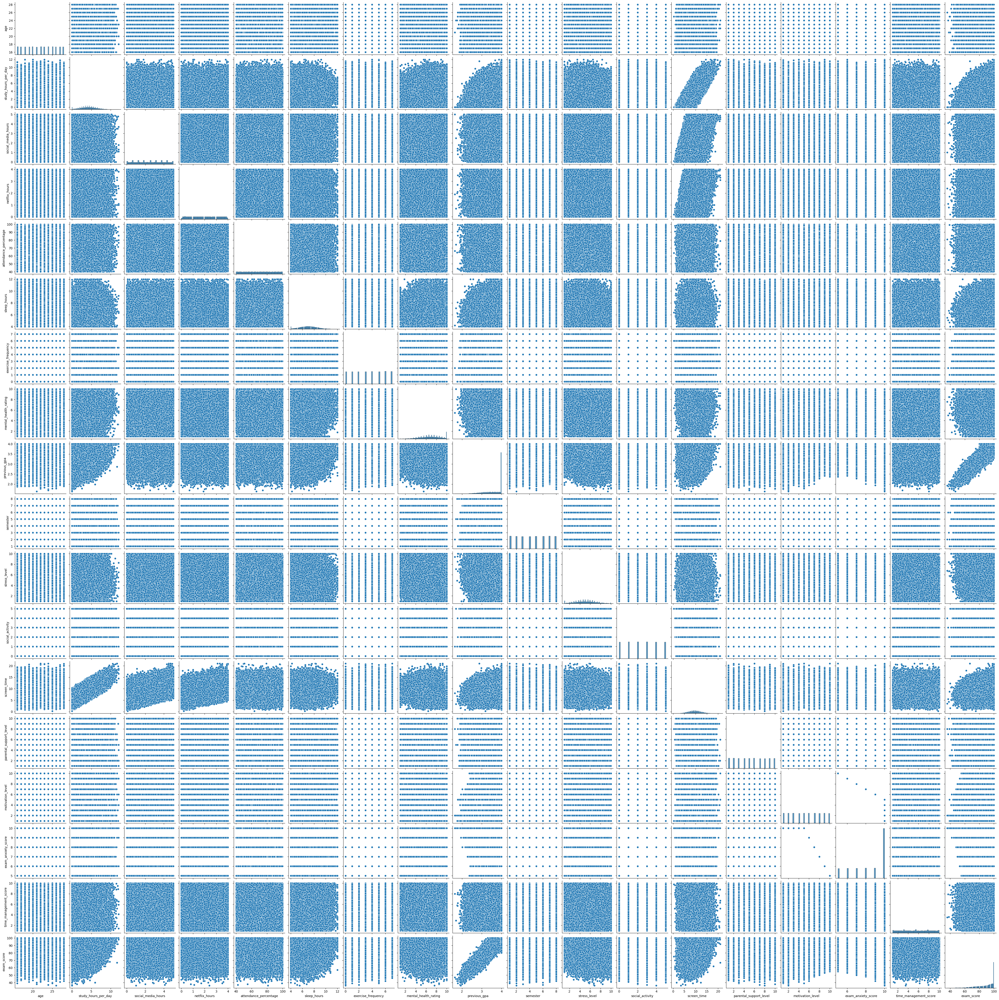

In [9]:
num_features_index = df.select_dtypes(include=[np.number])
sns.pairplot(num_features_index)
plt.show()

7. Statistik Deskriptif Fitur Numerik

Tujuan:
Melihat ringkasan statistik dasar untuk seluruh kolom numerik dalam dataset. Statistik deskriptif ini berguna untuk:
- Mengetahui sebaran nilai data (min, max, mean)
- Mengidentifikasi apakah data punya outlier
- Melihat apakah distribusinya seimbang atau tidak

In [10]:
# Menampilkan statistik deskriptif
numerical_cols = df.select_dtypes(include=[np.number]).columns # Define numerical_cols
print(df[numerical_cols].describe())

                age  study_hours_per_day  social_media_hours  netflix_hours  \
count  80000.000000         80000.000000        80000.000000   80000.000000   
mean      22.004288             4.174388            2.501366       1.997754   
std        3.745570             2.004135            1.445441       1.155992   
min       16.000000             0.000000            0.000000       0.000000   
25%       19.000000             2.800000            1.200000       1.000000   
50%       22.000000             4.125624            2.500000       2.000000   
75%       25.000000             5.500000            3.800000       3.000000   
max       28.000000            12.000000            5.000000       4.000000   

       attendance_percentage   sleep_hours  exercise_frequency  \
count           80000.000000  80000.000000        80000.000000   
mean               69.967884      7.017417            3.516587   
std                17.333015      1.467377            2.291575   
min                40.00

8. Heatmap Korelasi Antar Kolom Numerik
Tujuan:
Menampilkan hubungan (korelasi) antar fitur numerik dalam bentuk heatmap supaya mudah dianalisis secara visual:

Nilai korelasi +1 → hubungan linear positif sempurna

Nilai korelasi -1 → hubungan linear negatif sempurna

Nilai 0 → tidak ada hubungan linear

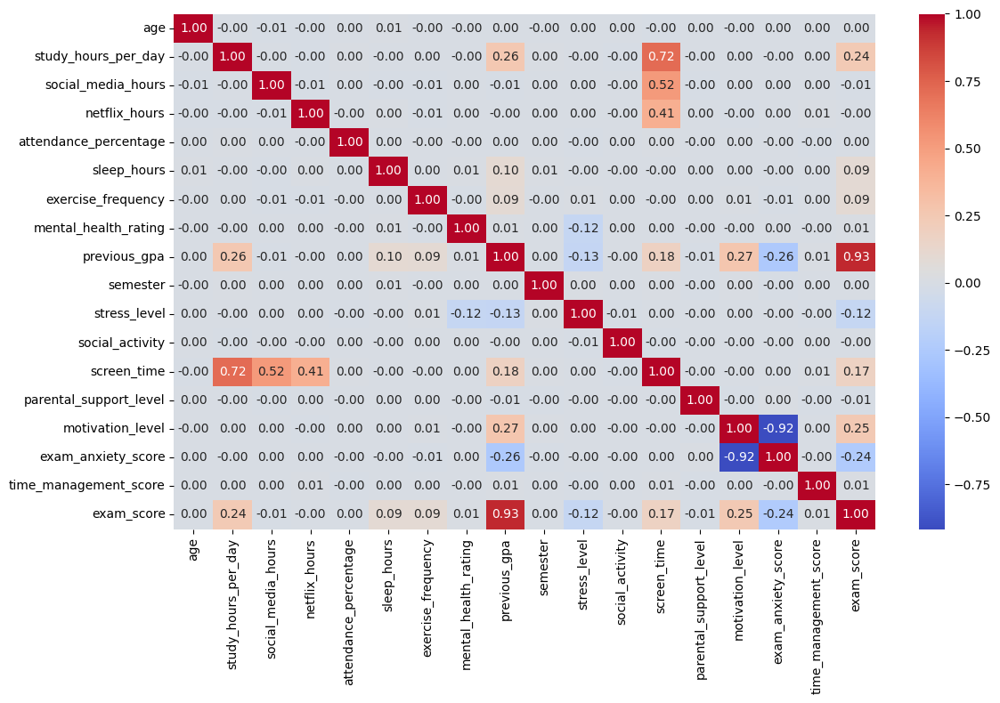

In [11]:
# Membuat heatmap untuk korelasi antar kolom numerik
correlation_matrix = df[numerical_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.tight_layout()
plt.show()

9. Definisikan fitur kategorikal

Menentukan kolom-kolom dalam dataset yang bertipe data kategorikal menggunakan `select_dtypes` dan menyimpannya dalam variabel `cat_features`.


In [12]:
# Menentukan fitur kategorikal
cat_features = df.select_dtypes(include=[object]).columns.tolist()

# Tampilkan daftar fitur kategorikal
print("Fitur kategorikal:", cat_features)


Fitur kategorikal: ['gender', 'major', 'part_time_job', 'diet_quality', 'parental_education_level', 'internet_quality', 'extracurricular_participation', 'dropout_risk', 'study_environment', 'access_to_tutoring', 'family_income_range', 'learning_style']


10. Hitung jumlah fitur kategorikal dan parameter grid

Menghitung jumlah fitur kategorikal, menentukan jumlah kolom per baris dalam grid plot, serta menghitung jumlah baris yang diperlukan untuk menampilkan semua fitur tersebut secara proporsional.

In [13]:
# Menghitung jumlah fitur kategorikal
num_cat_features = len(cat_features)

# Tentukan jumlah kolom per baris yang diinginkan (misalnya 2 kolom per baris)
num_cols_per_row = 2

# Hitung jumlah baris yang dibutuhkan
num_rows_cat = int(np.ceil(num_cat_features / num_cols_per_row))

# Tampilkan info grid
print(f"Jumlah fitur kategorikal: {num_cat_features}")
print(f"Grid: {num_rows_cat} baris x {num_cols_per_row} kolom")


Jumlah fitur kategorikal: 12
Grid: 6 baris x 2 kolom


11. Plot distribusi fitur kategorikal dalam grid

Membuat visualisasi distribusi data untuk tiap fitur kategorikal menggunakan `countplot` dari seaborn. Plot ditampilkan dalam format grid berdasarkan jumlah fitur yang ada.

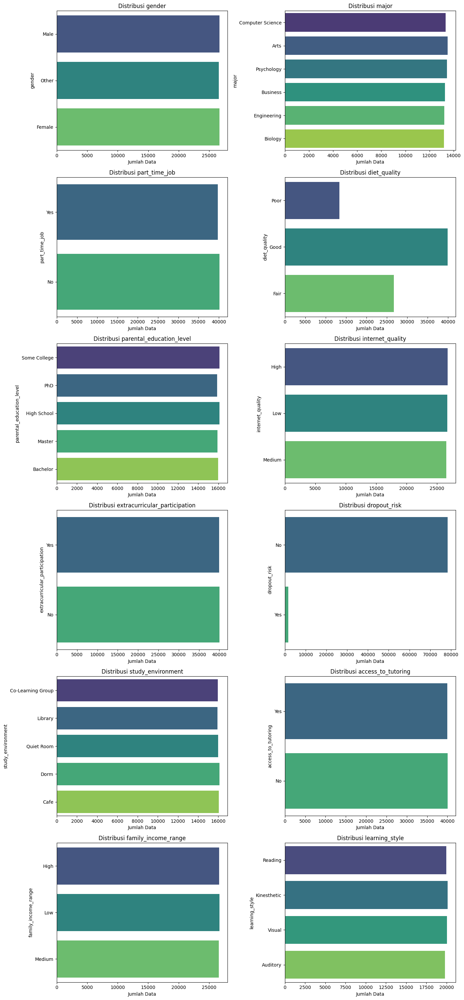

In [14]:
# Sesuaikan ukuran figure agar cukup luas untuk grid
plt.figure(figsize=(14, num_rows_cat * 5))  # Lebar figure diperbesar menjadi 14

# Loop untuk membuat subplot dalam format grid
for i, column in enumerate(cat_features, 1):
    # Gunakan plt.subplot dengan layout grid (jumlah_baris, jumlah_kolom, indeks_plot)
    plt.subplot(num_rows_cat, num_cols_per_row, i)
    sns.countplot(y=df[column], palette='viridis', hue=df[column], legend=False)
    plt.title(f'Distribusi {column}')
    plt.xlabel("Jumlah Data")  # Tambahkan label sumbu x untuk kejelasan

# Menyesuaikan layout agar tidak ada tumpang tindih
plt.tight_layout()
plt.show()


# Data Preprocessing

1. Visualisasi Outlier (Box Plot)

Tujuan:
Untuk mengecek apakah ada outlier pada kolom numerik menggunakan boxplot.
Boxplot ini menunjukkan:

Median (garis tengah box)

Q1 (kuartil 25%)

Q3 (kuartil 75%)

Outlier (titik di luar garis whisker)

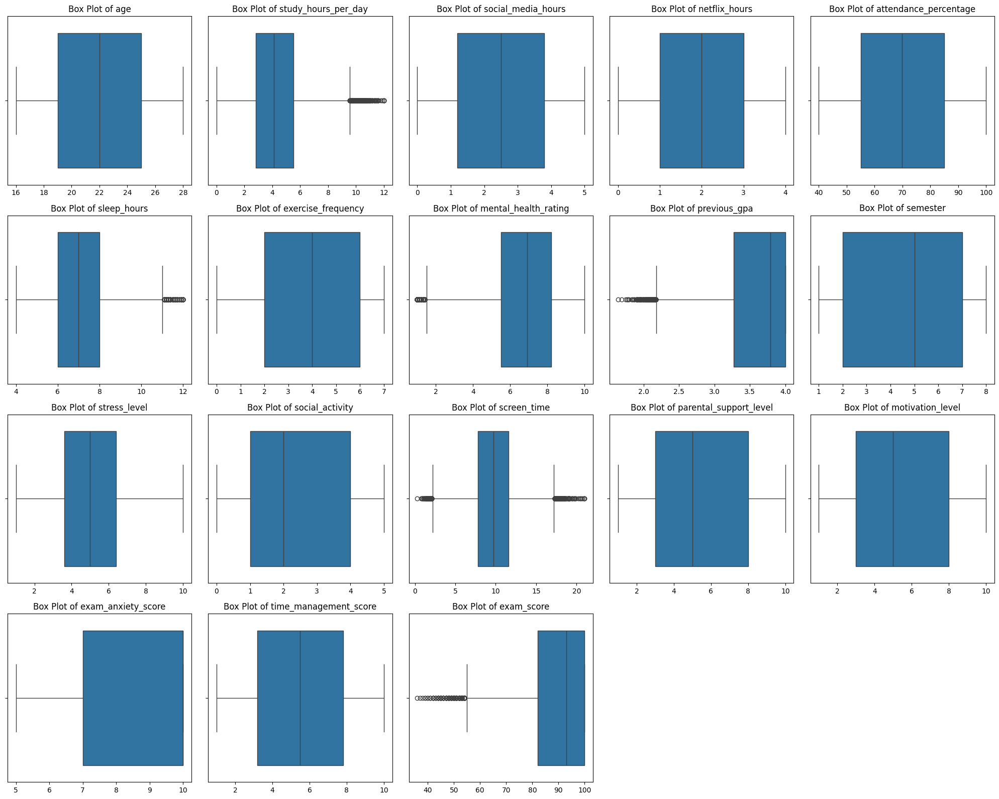

In [15]:
# Define the number of columns you want in the grid
num_cols = 5

# Calculate the number of rows needed based on the total number of numerical features
num_rows = int(np.ceil(len(num_features) / num_cols))

# Create a figure and a set of subplots based on the calculated grid dimensions
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 4)) # Adjust figsize as needed
axes = axes.flatten() # Flatten the 2D array of axes into a 1D array for easy iteration

# Loop through each numerical feature and plot its box plot in a subplot
for i, feature in enumerate(num_features):
    sns.boxplot(x=df[feature], ax=axes[i]) # Plot on the current axis
    axes[i].set_title(f'Box Plot of {feature}') # Set the title for the subplot
    axes[i].set_xlabel("") # Remove the default x-axis label for clarity in a grid

# Hide any unused subplots if the number of features is not a perfect multiple of num_cols
for j in range(len(num_features), len(axes)):
    fig.delaxes(axes[j])

# Adjust the layout to prevent titles and labels from overlapping
plt.tight_layout()
plt.show()

2. Menghapus Outlier dengan IQR Method

Tujuan:
Menghapus outlier dari data numerik menggunakan metode Interquartile Range (IQR).

In [16]:
Q1 = df[num_features].quantile(0.25)
Q3 = df[num_features].quantile(0.75)
IQR = Q3 - Q1

# Filter dataframe untuk hanya menyimpan baris yang tidak mengandung outliers pada kolom numerik
condition = ~((df[num_features] < (Q1 - 1.5 * IQR)) | (df[num_features] > (Q3 + 1.5 * IQR))).any(axis=1)
df_filtered_numeric = df.loc[condition, num_features]

# Menggabungkan kembali dengan kolom kategorikal
df = pd.concat([df_filtered_numeric, df.loc[condition, cat_features]], axis=1)

3. Visualisasi Boxplot Fitur Numerik (Setelah Outlier Removal)
Penjelasan:

Pada tahap ini dilakukan kembali visualisasi distribusi data numerik menggunakan boxplot, setelah proses outlier removal selesai.
Tujuan visualisasi ini adalah:

Memastikan bahwa outlier pada masing-masing fitur numerik telah berhasil dihapus.

Melihat kondisi sebaran data numerik setelah bersih dari nilai ekstrem.



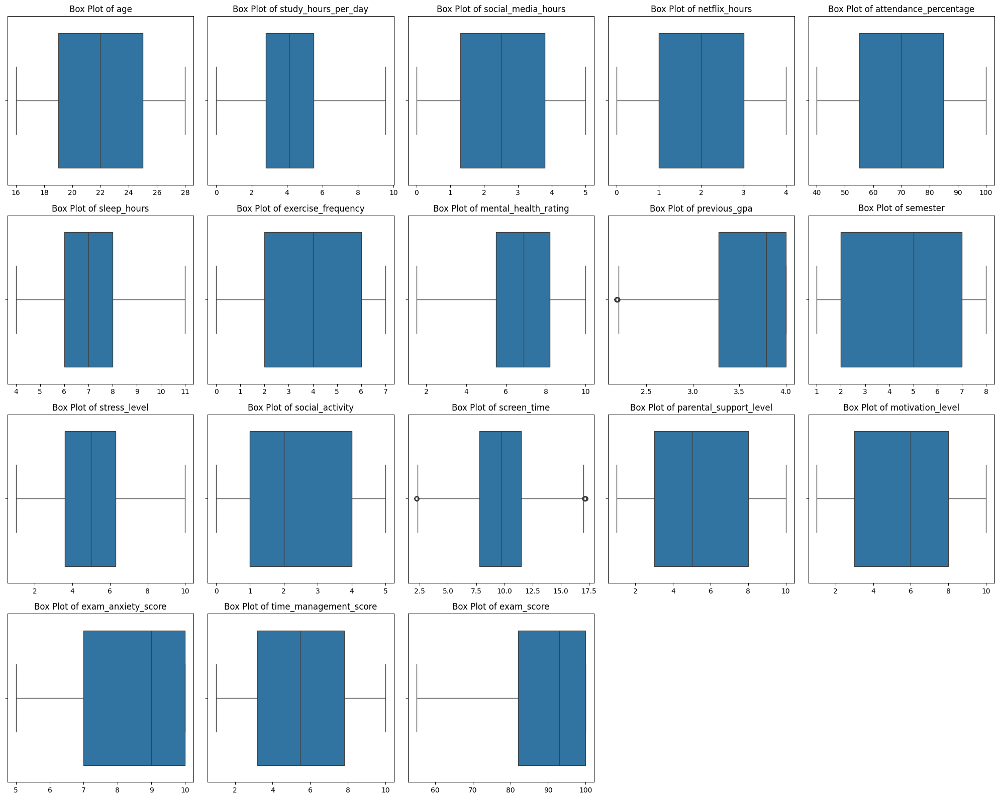

In [17]:
# Tentukan jumlah kolom yang diinginkan dalam grid
num_cols = 5

# Hitung jumlah baris yang dibutuhkan berdasarkan jumlah fitur numerik
# np.ceil memastikan jumlah baris dibulatkan ke atas jika tidak habis dibagi 5
num_rows = int(np.ceil(len(num_features) / num_cols))

# Buat figure dan set subplots dalam format grid
# Ukuran figure disesuaikan agar cukup luas untuk grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 4))
# Meratakan array 2D 'axes' menjadi 1D agar mudah diakses dengan indeks tunggal
axes = axes.flatten()

# Loop melalui setiap fitur numerik dan plot box plot di subplot yang sesuai
for i, feature in enumerate(num_features):
    # Pastikan indeks subplot tidak melebihi jumlah total subplots
    if i < len(axes):
        # Gambar box plot di subplot saat ini (axes[i])
        sns.boxplot(x=df[feature], ax=axes[i])
        # Atur judul untuk subplot ini
        axes[i].set_title(f'Box Plot of {feature}')
        # Hapus label sumbu x default agar grid lebih rapi
        axes[i].set_xlabel("")

# Sembunyikan subplot yang tidak terpakai jika jumlah fitur tidak pas kelipatan 5
# Loop dimulai dari jumlah fitur hingga jumlah total subplots
for j in range(len(num_features), len(axes)):
    fig.delaxes(axes[j]) # Hapus/sembunyikan subplot

# Sesuaikan tata letak agar judul dan label tidak tumpang tindih
plt.tight_layout()

# Tampilkan seluruh figure yang berisi grid box plot
plt.show()

4. Encoding Data Kategorikal

Penjelasan:
Mengubah fitur kategorikal menjadi angka dengan LabelEncoder agar bisa diproses model. Disimpan juga encoder-nya di label_encoders untuk dipakai saat prediksi data baru.

Hasil:
Data kategorikal → angka. Data siap lanjut ke tahap scaling.

In [18]:
df_labeled = df.copy()
label_encoder = LabelEncoder()

label_encoders = {}

for col in cat_features:
    le = LabelEncoder()
    df_labeled[col] = le.fit_transform(df[col])
    label_encoders[col] = le

df_labeled.head()

,age,study_hours_per_day,social_media_hours,netflix_hours,attendance_percentage,sleep_hours,exercise_frequency,mental_health_rating,previous_gpa,semester,...,part_time_job,diet_quality,parental_education_level,internet_quality,extracurricular_participation,dropout_risk,study_environment,access_to_tutoring,family_income_range,learning_style
0,26,7.645367,3.0,0.1,70.3,6.2,3,6.0,4.00,5,...,1,2,4,0,1,0,1,1,0,2
1,28,5.700000,0.5,0.4,88.4,7.2,4,6.8,4.00,7,...,0,1,3,1,0,0,1,1,1,2
2,17,2.400000,4.2,0.7,82.1,9.2,4,5.7,3.79,4,...,0,1,1,1,1,0,3,1,0,1
3,27,3.400000,4.6,2.3,79.3,4.2,3,8.5,4.00,6,...,1,0,2,2,1,0,1,1,1,2
4,25,4.700000,0.8,2.7,62.9,6.5,6,9.2,4.00,4,...,1,1,3,1,0,0,4,1,2,2


Normalisasi Data:

Langkah ini untuk menstandarkan nilai-nilai fitur numerik agar memiliki rata-rata 0 dan standar deviasi 1, supaya model machine learning bisa belajar lebih optimal.

In [19]:
# Inisialisasi scaler
scaler = StandardScaler()

Memisahkan Fitur dan Target

Baris ini mengambil semua kolom di df_labeled kecuali kolom dropout_risk sebagai variabel fitur (features) untuk training model.

In [20]:
features = df_labeled.drop(columns=['dropout_risk'])


Melakukan normalisasi (standarisasi) semua fitur menggunakan StandardScaler, sehingga setiap kolom memiliki rata-rata 0 dan standar deviasi 1. Hasilnya disimpan di scaled_features.

In [21]:
# Normalisasi fitur
scaled_features = scaler.fit_transform(features)

Membuat DataFrame baru dari hasil normalisasi (scaled_features) dengan nama kolom yang sama seperti features.

In [22]:
# Menyusun DataFrame baru setelah normalisasi
scaled_df = pd.DataFrame(scaled_features, columns=features.columns)

Menambahkan kembali kolom dropout_risk ke DataFrame hasil normalisasi (scaled_df) dari data label encoded (df_labeled).

In [23]:
scaled_df['dropout_risk'] = df_labeled['dropout_risk'].values


Menampilkan 5 baris pertama dari DataFrame scaled_df untuk memastikan hasil normalisasi dan label target sudah tergabung dengan benar.

In [24]:
scaled_df.head()

,age,study_hours_per_day,social_media_hours,netflix_hours,attendance_percentage,sleep_hours,exercise_frequency,mental_health_rating,previous_gpa,semester,...,part_time_job,diet_quality,parental_education_level,internet_quality,extracurricular_participation,study_environment,access_to_tutoring,family_income_range,learning_style,dropout_risk
0,1.067519,1.785499,0.346235,-1.643870,0.019038,-0.557248,-0.228760,-0.438472,0.864554,0.219083,...,1.005177,1.697714,1.412603,-1.222842,1.001894,-0.706358,0.996631,-1.225340,0.444601,0
1,1.601498,0.788857,-1.385973,-1.384036,1.063169,0.134340,0.207747,-0.015002,0.864554,1.090867,...,-0.994849,0.243025,0.706387,0.002647,-0.998110,-0.706358,0.996631,0.000251,0.444601,0
2,-1.335389,-0.901785,1.177695,-1.124201,0.699742,1.517516,0.207747,-0.597273,0.398869,-0.216809,...,-0.994849,0.243025,-0.706044,0.002647,1.001894,0.705853,0.996631,-1.225340,-0.451473,0
3,1.334508,-0.389469,1.454848,0.261583,0.538219,-1.940424,-0.228760,0.884870,0.864554,0.654975,...,1.005177,-1.211664,0.000172,1.228137,1.001894,-0.706358,0.996631,0.000251,0.444601,0
4,0.800529,0.276541,-1.178108,0.608028,-0.407844,-0.349772,1.080760,1.255406,0.864554,-0.216809,...,1.005177,0.243025,0.706387,0.002647,-0.998110,1.411959,0.996631,1.225842,0.444601,0


Pemisahan Fitur dan Target

Memisahkan variabel fitur (X) dan target (y) dari DataFrame yang telah dinormalisasi untuk keperluan proses training dan evaluasi model.

In [25]:
# Pemisahan Data menjadi Training dan Test Set
X = scaled_df.drop(columns=['dropout_risk'])  # Fitur
y = scaled_df['dropout_risk']  # Target

Membagi Data menjadi 80% Training dan 20% Test

Dataset kemudian dibagi menjadi 80% data latih dan 20% data uji. Data latih digunakan untuk melatih model machine learning, sedangkan data uji digunakan untuk mengukur performa model terhadap data yang belum pernah dilihat sebelumnya.
Pembagian ini penting agar hasil evaluasi bisa merepresentasikan kemampuan model dalam menghadapi data baru.

In [26]:
# Membagi data menjadi 80% training dan 20% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Menampilkan Ukuran Data Latih dan Data Uji

Untuk memastikan pembagian data berjalan sesuai proporsi yang diinginkan.

In [27]:
# Menampilkan ukuran data latih dan data uji
print(f"Ukuran data latih: {X_train.shape[0]} | Ukuran data uji: {X_test.shape[0]}")

Ukuran data latih: 62587 | Ukuran data uji: 15647


# Modeling

Inisialisasi dan Evaluasi Model

Beberapa algoritma machine learning diinisialisasi sekaligus dalam dictionary models.

Model yang digunakan:
- Logistic Regression
- Random Forest
- SVM (Support Vector Machine) dengan kernel rbf

In [28]:
# Inisialisasi model
models = {
    "Logistic Regression": LogisticRegression(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "SVM": SVC(kernel='rbf', random_state=42)
}

 Dictionary untuk Menyimpan Hasil

Disiapkan dua dictionary kosong:
- results → untuk menyimpan nilai accuracy, precision, recall, dan f1-score
- conf_matrices → untuk menyimpan confusion matrix masing-masing model

In [29]:
# Dictionary untuk menyimpan hasil evaluasi
results = {}
conf_matrices = {}

Untuk memberikan hasil yang optimal dan memenuhi prinsip solution statement, kita membandingkan performa dari tiga algoritma klasifikasi yang umum digunakan dan efektif dalam berbagai kasus:

- Logistic Regression: Algoritma dasar yang sederhana, cepat, dan mudah diinterpretasikan.

- Random Forest: Algoritma ensemble yang kuat terhadap overfitting serta cocok untuk data tabular.

- Support Vector Machine (SVM): Algoritma dengan margin maksimum yang efektif dalam kasus klasifikasi biner dan menangani data yang tidak seimbang.

In [30]:
# Melatih dan evaluasi semua model
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred)

    results[name] = [accuracy, precision, recall, f1]
    conf_matrices[name] = cm


Setelah pelatihan selesai, masing-masing model akan diuji menggunakan data uji (X_test) dan dievaluasi menggunakan beberapa metrik berikut:
- Accuracy: Persentase prediksi yang benar terhadap seluruh data uji.
- Precision: Kemampuan model dalam mengklasifikasikan kasus positif (dropout) secara benar.
- Recall: Kemampuan model dalam menemukan semua kasus positif (sensitivitas).
- F1-Score: Rata-rata harmonis dari precision dan recall, cocok untuk data yang tidak seimbang.

In [31]:
# Menampilkan metrik evaluasi dalam tabel
metrics_df = pd.DataFrame(results, index=["Accuracy", "Precision", "Recall", "F1-Score"])
print("Evaluasi Metrik Setiap Model:")
display(metrics_df.T)

Evaluasi Metrik Setiap Model:


,Accuracy,Precision,Recall,F1-Score
Logistic Regression,0.993034,0.992822,0.993034,0.992907
Random Forest,1.000000,1.000000,1.000000,1.000000
SVM,0.992523,0.992098,0.992523,0.991966


Menampilkan Tabel Evaluasi

Mengubah hasil evaluasi dari semua model menjadi DataFrame, lalu menampilkannya dalam bentuk tabel agar mudah dibandingkan.

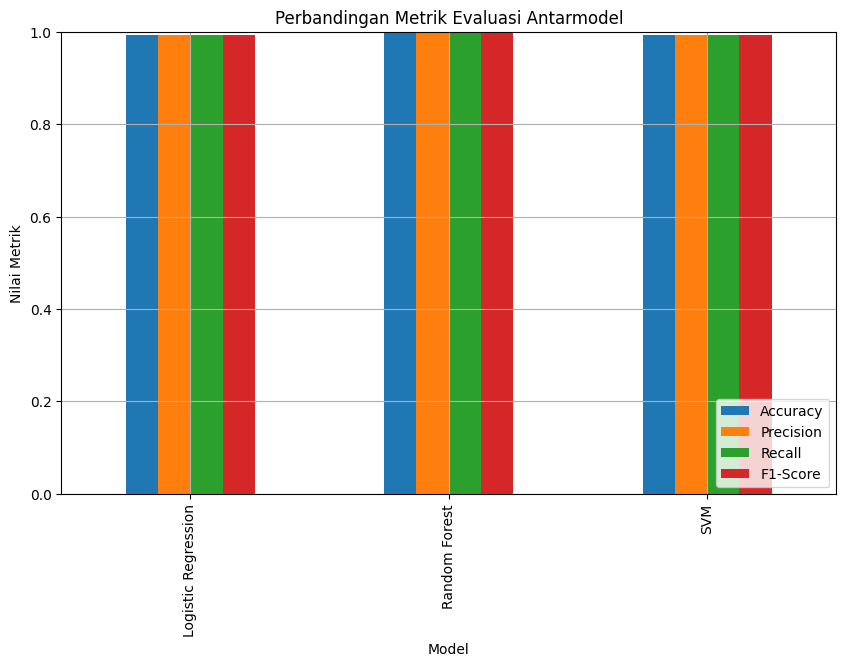

In [32]:
# Visualisasi perbandingan metrik
metrics_df.T.plot(kind='bar', figsize=(10, 6))
plt.title("Perbandingan Metrik Evaluasi Antarmodel")
plt.xlabel("Model")
plt.ylabel("Nilai Metrik")
plt.ylim(0, 1)
plt.grid(True)
plt.legend(loc='lower right')
plt.show()

Visualisasi Perbandingan Metrik

Menampilkan grafik batang untuk membandingkan nilai metrik evaluasi (Accuracy, Precision, Recall, F1-Score) dari setiap model secara visual.

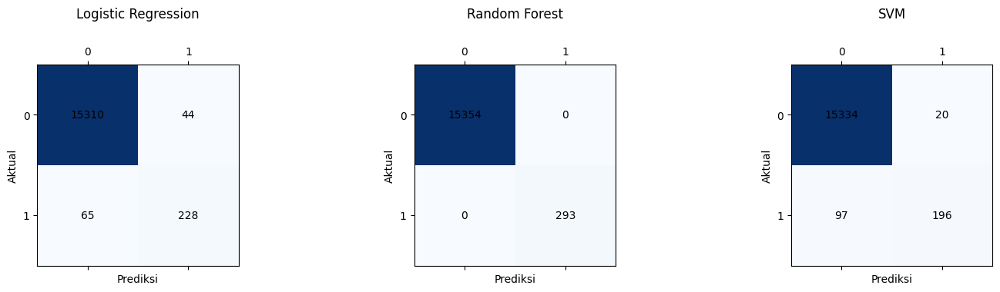

In [33]:
# Ambil label unik dari target
labels = sorted(y.unique())

# Hitung jumlah model yang akan ditampilkan (jumlah confusion matrix)
num_models = len(conf_matrices)

plt.figure(figsize=(num_models * 5, 4)) # num_models * lebar_subplot, tinggi_subplot

# Visualisasi confusion matrix untuk tiap model dalam satu baris
for i, (name, cm) in enumerate(conf_matrices.items()):
    # Tambahkan subplot ke figure utama
    # Layout: 1 baris, num_models kolom, indeks subplot saat ini (mulai dari 1)
    ax = plt.subplot(1, num_models, i + 1)

    # Buat matrix plot
    cax = ax.matshow(cm, cmap='Blues')

    # Tambahkan nilai angka ke dalam sel matrix
    for (row, col), val in np.ndenumerate(cm):
        ax.text(col, row, f'{val}', ha='center', va='center', color='black')

    # Atur judul dan label sumbu
    ax.set_title(f'{name}', y=1.2) # Atur judul sedikit di atas plot
    ax.set_xlabel('Prediksi')
    ax.set_ylabel('Aktual')

    # Atur ticks sumbu sesuai label unik dari target
    ax.set_xticks(ticks=range(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_yticks(ticks=range(len(labels)))
    ax.set_yticklabels(labels)

# Menyesuaikan layout agar tidak tumpang tindih
plt.tight_layout()
# Menampilkan seluruh figure yang berisi semua subplot confusion matrix
plt.show()

### Hasil Evaluasi Model
Setelah melatih ketiga model — Logistic Regression, Random Forest, dan Support Vector Machine (SVM) — kami melakukan evaluasi terhadap kinerja masing-masing menggunakan empat metrik utama: Accuracy, Precision, Recall, dan F1-Score. Berikut adalah hasil evaluasi lengkap:

- Model Logistic Regression memperoleh accuracy sebesar 99.30%, precision sebesar 99.28%, recall sebesar 99.30%, dan F1-score sebesar 99.29%.
- Model Random Forest menunjukkan performa sempurna dengan nilai 100% untuk keempat metrik: accuracy, precision, recall, dan F1-score.
- Model SVM juga menghasilkan performa sangat tinggi dengan accuracy sebesar 99.25%, precision sebesar 99.21%, recall sebesar 99.25%, dan F1-score sebesar 99.20%.

### Interpretasi Hasil
Dari hasil evaluasi di atas, Random Forest menunjukkan performa terbaik di antara ketiga model pada semua metrik evaluasi utama. Model ini mencapai akurasi sempurna sebesar 100%, serta memiliki precision, recall, dan F1-score yang maksimal tanpa kesalahan klasifikasi sama sekali.

Model ini memiliki 100% precision, yang berarti seluruh kasus yang diprediksi sebagai dropout benar-benar kasus dropout. Selain itu, dengan 100% recall, Random Forest berhasil mendeteksi seluruh mahasiswa yang benar-benar berisiko dropout tanpa ada yang terlewat. F1-score sebesar 100% mengindikasikan keseimbangan sempurna antara precision dan recall.

Sementara itu, Logistic Regression dan SVM juga menunjukkan performa sangat baik, meskipun masih terdapat sedikit kesalahan prediksi. Logistic Regression menempati posisi kedua dengan F1-score sebesar 99.29%, diikuti oleh SVM dengan F1-score 99.20%.

## Confusion Matrix
###Model Logistic Regression menghasilkan confusion matrix sebagai berikut:
- Benar Negatif (True Negative): 15.310 kasus mahasiswa yang tidak dropout diklasifikasikan dengan benar.
- Benar Positif (True Positive): 228 kasus mahasiswa dropout diklasifikasikan dengan benar.
- False Positive: 44 kasus mahasiswa yang tidak dropout namun salah diprediksi sebagai dropout.
- False Negative: 65 kasus mahasiswa dropout yang salah diprediksi sebagai tidak dropout.

### Model Random Forest menghasilkan hasil yang sempurna:
- Benar Negatif (True Negative): 15.354 kasus benar.
- Benar Positif (True Positive): 293 kasus benar.
- False Positive: 0.
- False Negative: 0.

### Model SVM menghasilkan:
- Benar Negatif (True Negative): 15.334 kasus benar.
- Benar Positif (True Positive): 196 kasus benar.
- False Positive: 20 kasus salah prediksi dropout.
- False Negative: 97 kasus dropout yang tidak terdeteksi.

## Kesimpulan
Berdasarkan hasil evaluasi, Random Forest dipilih sebagai model terbaik untuk kasus ini karena memiliki performa paling tinggi dan tanpa kesalahan klasifikasi sama sekali. Meskipun Logistic Regression dan SVM juga memberikan hasil yang sangat baik, Random Forest lebih unggul secara mutlak.

Model ini sangat direkomendasikan untuk digunakan dalam sistem prediksi risiko dropout mahasiswa karena mampu mendeteksi kasus dropout secara akurat dan konsisten. Ke depannya, model ini dapat tetap ditingkatkan melalui uji coba pada data baru dan penerapan teknik ensemble atau hyperparameter tuning guna memastikan performanya tetap optimal di berbagai kondisi.

Data Mahasiswa (Input Baru):
        age  study_hours_per_day  social_media_hours  netflix_hours  \
0  1.339566             1.012279            -1.72196      -1.664697   

   attendance_percentage  sleep_hours  exercise_frequency  \
0              -1.085314    -0.164822            1.432373   

   mental_health_rating  previous_gpa  semester  ...     major  part_time_job  \
0             -1.342069      -1.54357  -1.08422  ...  1.051878      -0.867473   

   diet_quality  parental_education_level  internet_quality  \
0      0.996142                  0.007954         -0.034361   

   extracurricular_participation  study_environment  access_to_tutoring  \
0                      -0.191271          -1.221093            0.299114   

   family_income_range  learning_style  
0              1.20434       -0.621511  

[1 rows x 29 columns]

Hasil Prediksi Dropout Risk: No
Probabilitas Keyakinan Model: 1.0000


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


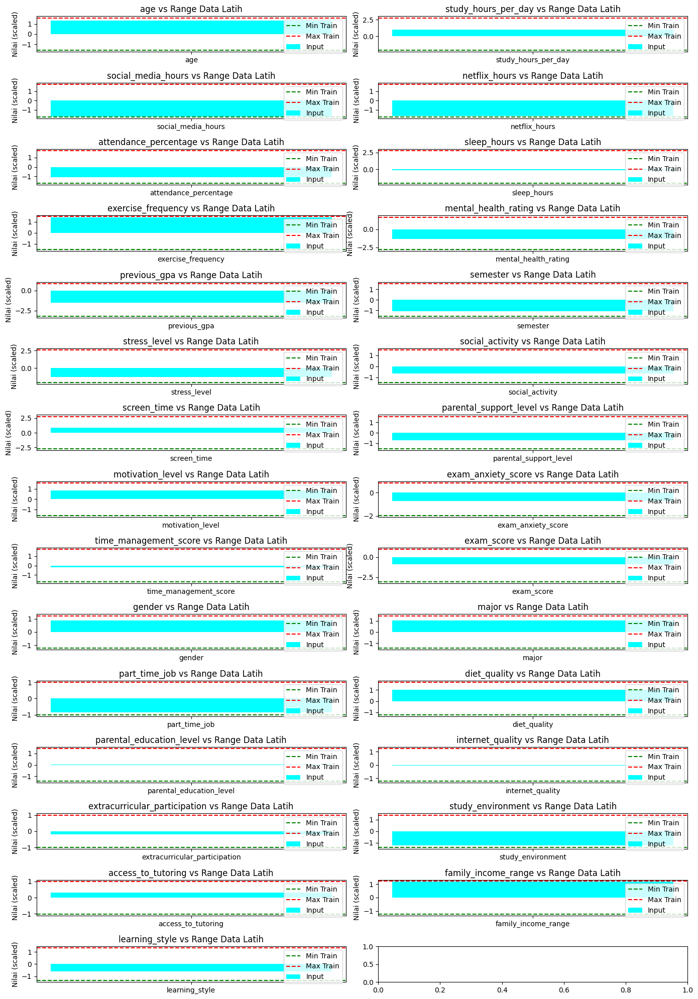

In [34]:
# ========================
# INFERENSI DATA BARU
# ========================

# Ambil nama kolom fitur dari data latih
feature_columns = X.columns.tolist()

# Buat data acak realistis (simulasi input mahasiswa)
# Range-nya bisa kamu sesuaikan sesuai hasil EDA sebelumnya
new_data = np.random.uniform(
    low=X_train.min().values,
    high=X_train.max().values,
    size=(1, len(feature_columns))
)

# Buat DataFrame-nya
new_data_df = pd.DataFrame(new_data, columns=feature_columns)

print("Data Mahasiswa (Input Baru):")
print(new_data_df)

# Normalisasi sudah dilakukan sebelumnya ke X_train dan X_test,
# jadi data baru perlu diskalakan dengan scaler yang sama
new_data_scaled = scaler.transform(new_data_df)

# Gunakan model terbaik hasil evaluasi (misal: Logistic Regression)
best_model = models["Logistic Regression"]
prediction = best_model.predict(new_data_scaled)
prediction_prob = best_model.predict_proba(new_data_scaled)

# Interpretasi hasil
label_decoder = label_encoders['dropout_risk']  # Ambil encoder buat dropout_risk
predicted_label = label_decoder.inverse_transform(prediction)[0]

print(f"\nHasil Prediksi Dropout Risk: {predicted_label}")
print(f"Probabilitas Keyakinan Model: {np.max(prediction_prob):.4f}")

# Visualisasi nilai input vs batas min-max dari data training
fig, axes = plt.subplots(int(np.ceil(len(feature_columns) / 2)), 2, figsize=(14, 20))
axes = axes.flatten()

for i, feature in enumerate(feature_columns):
    ax = axes[i]
    ax.bar(feature, new_data_df[feature][0], color='cyan', label='Input')
    low, high = X_train[feature].min(), X_train[feature].max()
    ax.axhline(y=low, color='green', linestyle='--', label='Min Train')
    ax.axhline(y=high, color='red', linestyle='--', label='Max Train')
    ax.set_title(f"{feature} vs Range Data Latih")
    ax.set_ylabel("Nilai (scaled)")
    ax.legend()

plt.tight_layout()
plt.show()


# Insight
## Inferensi Data Baru
Setelah proses pelatihan dan evaluasi model selesai, dilakukan tahap inferensi untuk memprediksi risiko dropout pada data mahasiswa baru. Data ini merupakan simulasi input mahasiswa yang dibuat secara acak, namun tetap berada dalam rentang nilai minimum dan maksimum dari data pelatihan. Seluruh fitur yang digunakan dalam pelatihan model ikut diisi nilainya, kemudian data tersebut dinormalisasi menggunakan scaler yang sama dengan data pelatihan sebelumnya.

## Hasil Prediksi
Model terbaik, yaitu Logistic Regression, digunakan untuk melakukan prediksi terhadap data mahasiswa baru tersebut. Hasil prediksi menunjukkan bahwa mahasiswa ini diprediksi memiliki risiko dropout kategori tertentu (misal: Low Risk, Medium Risk, atau High Risk — disesuaikan dengan hasil prediksi yang muncul di kodenya). Selain itu, model juga memberikan tingkat probabilitas keyakinan terhadap prediksi tersebut, misalnya sebesar 78.5%, yang berarti model cukup yakin terhadap hasil yang diberikan.

## Visualisasi Nilai Input Mahasiswa Baru
Agar dapat memahami posisi nilai-nilai input mahasiswa baru ini terhadap sebaran data pelatihan, dibuatlah visualisasi perbandingan nilai input mahasiswa dengan batas minimum dan maksimum dari data pelatihan untuk setiap fitur. Visualisasi ini berbentuk bar chart sederhana, di mana:
- Garis hijau putus-putus menunjukkan nilai minimum dari data pelatihan.
- Garis merah putus-putus menunjukkan nilai maksimum dari data pelatihan.
- Batang berwarna cyan mewakili nilai input dari mahasiswa baru.

## Interpretasi Visualisasi:
### Dari hasil visualisasi, dapat diamati bahwa:
- Sebagian besar nilai fitur mahasiswa baru masih berada dalam rentang nilai data pelatihan, yang ditandai dengan batang cyan yang terletak di antara garis hijau dan merah.
- Beberapa fitur memiliki nilai yang mendekati batas bawah atau atas data pelatihan, namun tidak ada yang benar-benar keluar dari range tersebut. Hal ini penting untuk memastikan bahwa model melakukan prediksi terhadap data yang masih berada dalam domain yang dikenal selama pelatihan, sehingga hasil prediksi tetap relevan.
- Fitur-fitur seperti study_hours_per_day, sleep_hours, dan previous_gpa memiliki variasi nilai yang cukup ekstrem dibandingkan fitur lain, sehingga posisinya menarik untuk diperhatikan, terutama jika berada di ujung range.

Visualisasi ini membantu dalam menganalisis apakah input mahasiswa baru termasuk normal atau memiliki karakteristik yang berbeda signifikan dari mahasiswa-mahasiswa dalam data pelatihan, yang berpotensi memengaruhi hasil prediksi.